## Imports

In [34]:
# to było mi potrzebne, aby zadziałała funkcja pobierająca fmnista

# import ssl

# ssl._create_default_https_context = ssl._create_unverified_context

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

In [2]:
# necessary to update script changes without restarting the entire kernel
import importlib
import centroids

importlib.reload(centroids)
from centroids import compute_centroids, measure_distances, tsne_algorithms, tsne_clean, umap_algorithms, umap_clean

## Dataset

In [3]:
from keras.datasets import fashion_mnist

(X_train_full, y_train_full), (X_test_full, y_test_full) = fashion_mnist.load_data()

train_images, _, train_labels, _ = train_test_split(X_train_full, y_train_full, train_size=0.3, random_state=42)
test_images, _, test_labels, _ = train_test_split(X_test_full, y_test_full, train_size=0.3, random_state=42)

In [4]:
print(train_images.shape)
print(test_images.shape)
X_train = train_images.reshape(train_images.shape[0], -1)
X_test = test_images.reshape(test_images.shape[0], -1)
print(X_train.shape)
print(X_test.shape)

(18000, 28, 28)
(3000, 28, 28)
(18000, 784)
(3000, 784)


In [5]:
y_train, y_test= train_labels, test_labels

In [6]:
print(y_train.shape)
print(y_test.shape)

(18000,)
(3000,)


In [7]:
print(X_train)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [8]:
print(set(y_train))
print(set(y_test))

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}


In [9]:
n_centroids=[10, 30, 70]

## Kmeans algorithm

Global centroids

In [10]:
kmeans_global_centroids = {}
kmeans_global_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids("kmeans", "global", X_train, y_train, 0, n)
    kmeans_global_centroids[n] = centroids
    kmeans_global_labels[n] = cluster_labels

Local centroids

In [45]:
kmeans_local_centroids = {}
kmeans_local_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids("kmeans", "local", X_train, y_train, int(n), 0)
    kmeans_local_centroids[int(n)] = centroids
    kmeans_local_labels[int(n)] = cluster_labels

## Agglomerative clustering algorithm

Global centroids

In [45]:
agglomerative_global_centroids = {}
agglomerative_global_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids("agglomerative", "global", X_train, y_train, 0, n)
    agglomerative_global_centroids[n] = centroids
    agglomerative_global_labels[n] = cluster_labels

Local centroids

In [46]:
agglomerative_local_centroids = {}
agglomerative_local_labels = {}

for n in n_centroids:
    centroids, cluster_labels = compute_centroids("agglomerative", "local", X_train, y_train, int(n/10), 0)
    agglomerative_local_centroids[int(n/10)] = centroids
    agglomerative_local_labels[int(n/10)] = cluster_labels

## DBSCAN algorithm

Global centroids

In [47]:
# trzeba poszukac odpowiednich parametrow
dbscan_global_centroids, dbscan_global_labels=compute_centroids("dbscan", "global", X_train, y_train, 0, 1, epsilon=1100, min_samples=40)

In [48]:
print(dbscan_global_centroids)

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.01618497 0.01849711 0.01965318 ... 0.26936416 0.06589595 0.0150289 ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.08955224 ... 0.01492537 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [49]:
print(dbscan_global_centroids.shape)

(6, 784)


Local centroids

In [50]:
# trzeba poszukac odpowiednich parametrow
dbscan_local_centroids, dbscan_local_labels=compute_centroids("dbscan", "local", X_train, y_train, epsilon=1100, min_samples=40)

In [51]:
print(dbscan_local_centroids)

[[0.         0.00847458 0.02542373 ... 0.01694915 0.         0.        ]
 [0.         0.         0.09230769 ... 0.01538462 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.1372549  0.12745098 0.12745098 ... 0.28431373 0.11764706 0.11764706]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [52]:
print(dbscan_local_centroids.shape)

(5, 784)


## Jarvis-Patrick clustering algorithm

Global centroids

In [110]:
jp_global_centroids = {}
jp_global_labels = {}

# for kmin_ in range(100):
#     for k_ in range(kmin_, 120):
#         centroids, cluster_labels = compute_centroids("jp", "global", X_train, y_train, 0, 0, 0, 0, k_, kmin_)
#         if len(centroids) > 8 and len(centroids)<12:
#             print(centroids.shape)
#             print(kmin_)
#             print(k_)

centroids, cluster_labels = compute_centroids(algorithm="jp", method="global", x_data=X_train, y_data=y_train, k=200, kmin=50)
print(centroids.shape)
print(centroids)
print(cluster_labels)

jp_global_centroids=centroids

(45, 784)
[[2.71094544e-03 6.43849543e-03 3.15147408e-02 ... 2.82124703e+00
  8.22771942e-01 5.43883429e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.00000000e+00
  2.70833333e-01 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.00000000e+00
  0.00000000e+00 0.00000000e+00]]
[0 1 2 ... 0 None 0]


Local centroids

In [109]:
centroids, cluster_labels = compute_centroids(algorithm="jp", method="local", x_data=X_train, y_data=y_train, k=200, kmin=50)
print(centroids.shape)
print(centroids)
print(cluster_labels)

jp_local_centroids=centroids

(45, 784)
[[0.00000000e+00 1.55979203e-02 1.23050260e-01 ... 3.62218371e-01
  8.66551127e-03 0.00000000e+00]
 [0.00000000e+00 6.77966102e-03 9.15254237e-02 ... 2.71186441e-02
  3.38983051e-03 0.00000000e+00]
 [0.00000000e+00 8.13008130e-03 2.43902439e-02 ... 9.51219512e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.82736156e+00
  3.07328990e+00 1.72638436e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]
[0 1 2 ... 0 0 0]


In [53]:
# jp_local_centroids = {}
# jp_local_labels = {}

# for n in n_centroids:
#     centroids, cluster_labels = compute_centroids("jp", "local", X_train, y_train, int(n/10), 0)
#     jp_local_centroids[int(n/10)] = centroids
#     jp_local_labels[int(n/10)] = cluster_labels

In [30]:
# Nie działa
# Docelowo to powinno byc w centroids.py ale tutaj latwiej jest znalezc blad

# import jarvispatrick

# def euclidean_distance(point1, point2):
#     return np.linalg.norm(point1 - point2)

# def global_jp(x_data):
#     cluster_gen = jarvispatrick.JarvisPatrick(x_data, euclidean_distance)
#     cluster = cluster_gen( 4, 2 )
#     print(cluster)

# global_jp(X_train)


# import numpy as np

# def euclidean_distance(point1, point2):
#     return np.linalg.norm(np.array(point1) - np.array(point2))

# X_train_tuples = [tuple(point) for point in X_test]
# dataset_elements = [tuple(point) for point in X_train_tuples]

# cluster_generator = jarvispatrick.JarvisPatrick(dataset_elements, euclidean_distance)
# clusters = cluster_generator(4, 2)



In [33]:
# clusters

# # cluster_generator.cluster
# # clusters_array = np.array(list(clusters.values()))
# # cluster_array = clusters_array.reshape(clusters_array.shape[0], clusters_array.shape[2])

# # cluster_array.shape

## Distances

In [46]:
kmeans_global_distances={}
kmeans_local_distances={}
# agglomerative_global_distances={}
# agglomerative_local_distances={}

for n in n_centroids:
    kmeans_global_distances[n] = measure_distances(X_test, kmeans_global_centroids[n], "kmeans", "global", n, "euclidean")
    kmeans_local_distances[int(n)] = measure_distances(X_test, kmeans_local_centroids[int(n)], "kmeans", "local", n, "euclidean")
    # agglomerative_global_distances[n] = measure_distances(X_test, agglomerative_global_centroids[n], "agglomerative", "global", n, "euclidean")
    # agglomerative_local_distances[int(n/10)] = measure_distances(X_test, agglomerative_local_centroids[int(n/10)], "agglomerative", "local", n, "euclidean")

# dbscan_global_distances = measure_distances(X_test, dbscan_global_centroids, "dbscan", "global", 10, "euclidean")
# dbscan_local_distances = measure_distances(X_test, dbscan_local_centroids, "dbscan", "local", 10, "euclidean")

# jp_global_distances = measure_distances(X_test, jp_global_centroids, "jp", "global", 10, "euclidean")
# jp_local_distances = measure_distances(X_test, jp_local_centroids, "jp", "local", 10, "euclidean")

In [112]:
print(kmeans_global_distances[10].shape)
print(kmeans_local_distances[1].shape)
print(agglomerative_global_distances[10].shape)
print(agglomerative_local_distances[1].shape)
print(dbscan_global_distances.shape)
print(dbscan_local_distances.shape)

print(jp_global_distances.shape)
print(jp_local_distances.shape)

(1000, 10)
(1000, 10)
(1000, 10)
(1000, 10)
(1000, 6)
(1000, 5)
(1000, 45)
(1000, 45)


## Visualization with UMAP

Kmeans

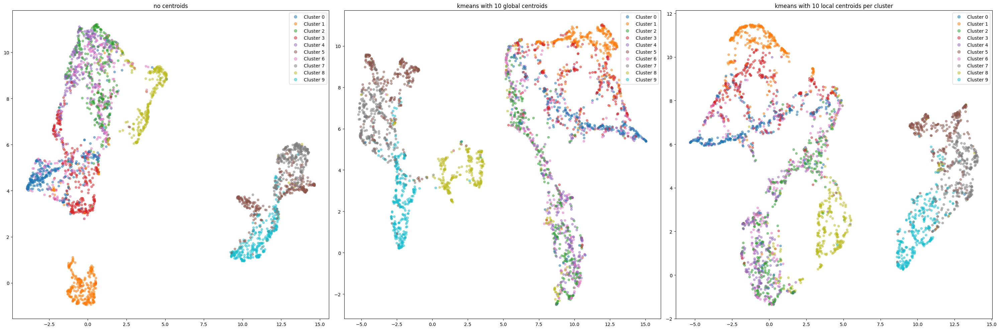

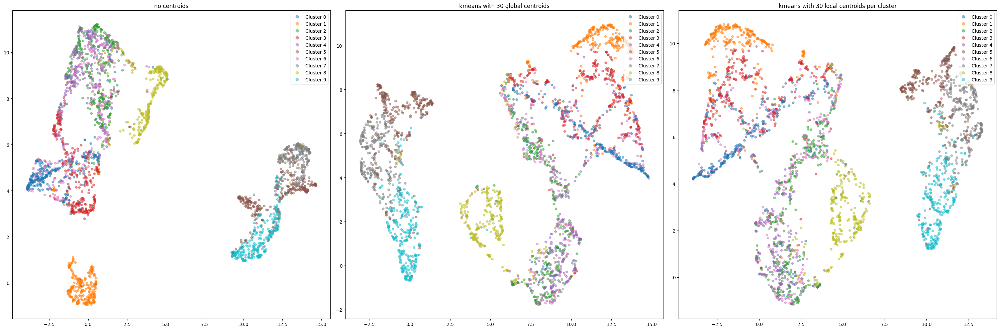

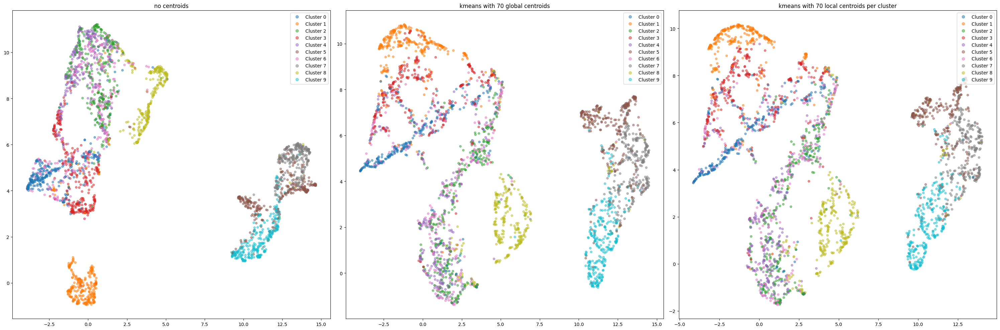

In [47]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    umap_clean(X_test, y_test, "kmeans", axs[0])
    umap_algorithms(kmeans_global_distances[n], y_test, "kmeans", "global", n, axs[1])
    umap_algorithms(kmeans_local_distances[int(n)], y_test, "kmeans", "local", n, axs[2])
    
    plt.tight_layout()
    plt.show()

Agglomerative clustering

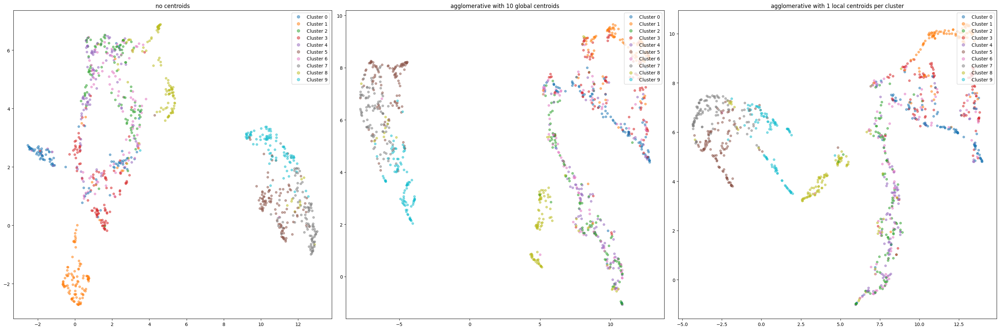

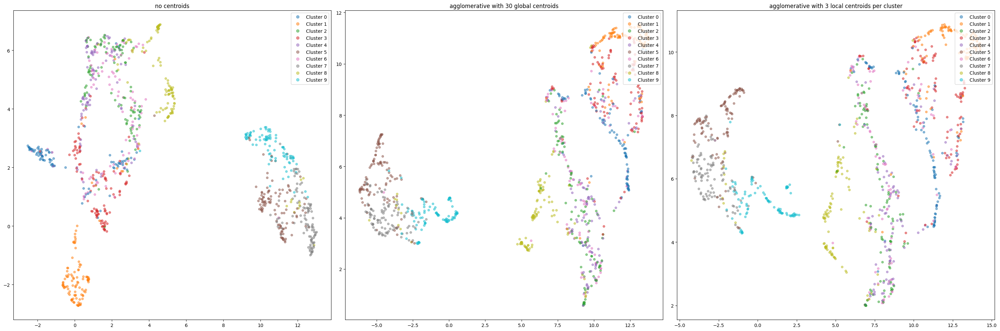

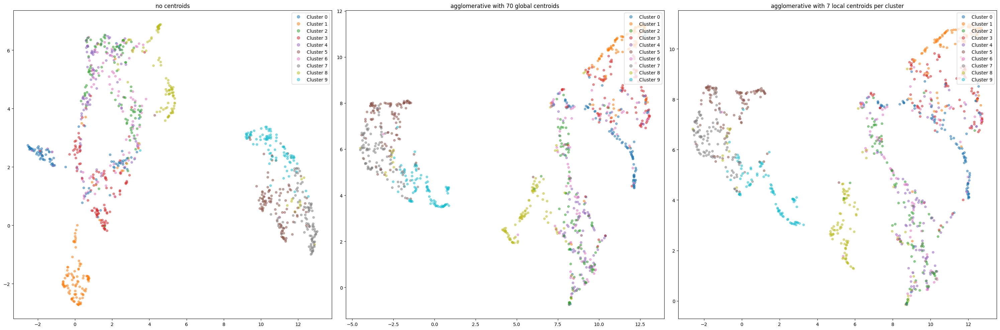

In [58]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    umap_clean(X_test, y_test, "agglomerative", axs[0])
    umap_algorithms(agglomerative_global_distances[n], y_test, "agglomerative", "global", n, axs[1])
    umap_algorithms(agglomerative_local_distances[int(n/10)], y_test, "agglomerative", "local", n/10, axs[2])
    
    plt.tight_layout()
    plt.show()

DBSCAN

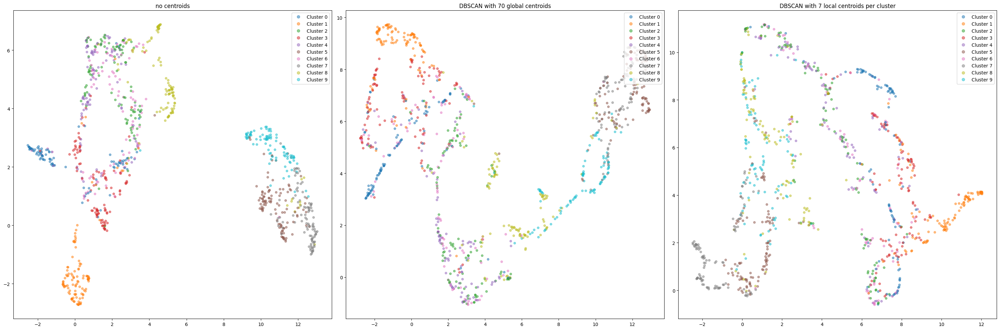

In [57]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
umap_clean(X_test, y_test, "dbscan", axs[0])
umap_algorithms(dbscan_global_distances, y_test, "DBSCAN", "global", n, axs[1])
umap_algorithms(dbscan_local_distances, y_test, "DBSCAN", "local", n/10, axs[2])    

plt.tight_layout()
plt.show()

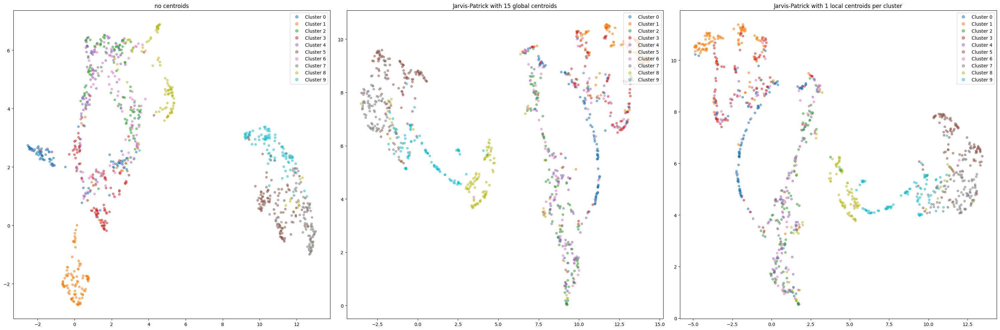

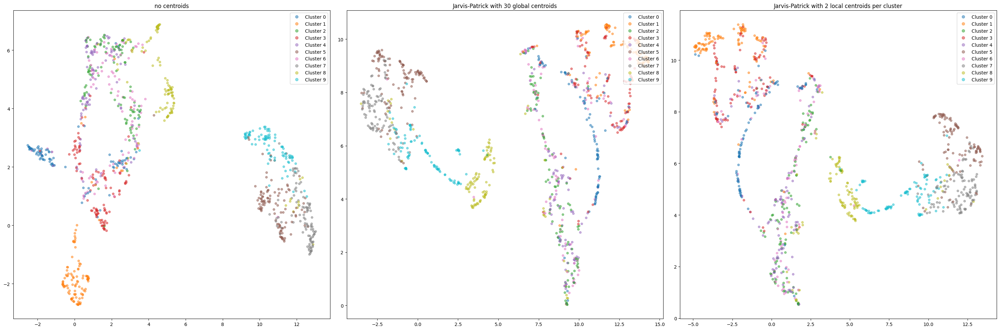

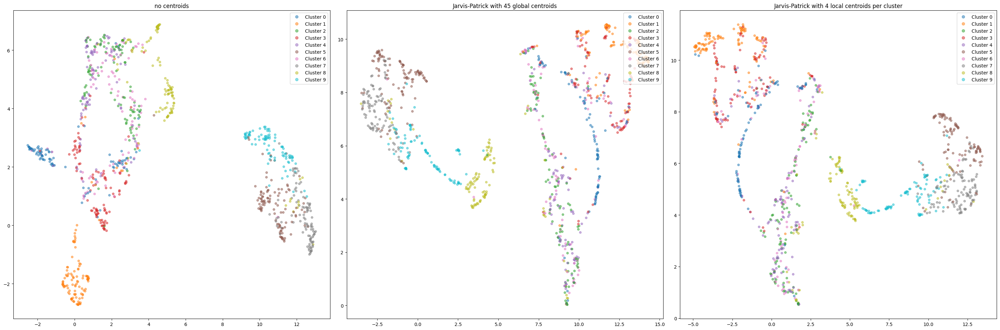

In [114]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
umap_clean(X_test, y_test, "jp", axs[0])
umap_algorithms(jp_global_distances, y_test, "jp", "global", 15, axs[1])
umap_algorithms(jp_local_distances, y_test, "jp", "local", 14/10, axs[2])    

plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
umap_clean(X_test, y_test, "jp", axs[0])
umap_algorithms(jp_global_distances, y_test, "jp", "global", 30, axs[1])
umap_algorithms(jp_local_distances, y_test, "jp", "local", 27/10, axs[2])    

plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
umap_clean(X_test, y_test, "jp", axs[0])
umap_algorithms(jp_global_distances, y_test, "jp", "global", 45, axs[1])
umap_algorithms(jp_local_distances, y_test, "jp", "local", 45/10, axs[2])    

plt.tight_layout()
plt.show()

## Visualization with t-SNE

Kmeans

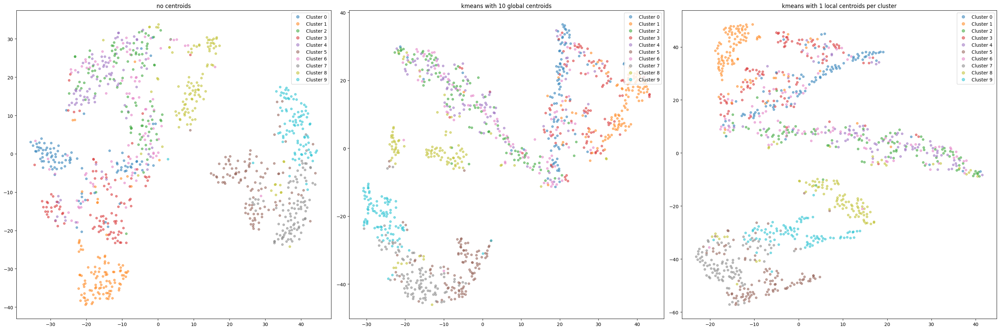

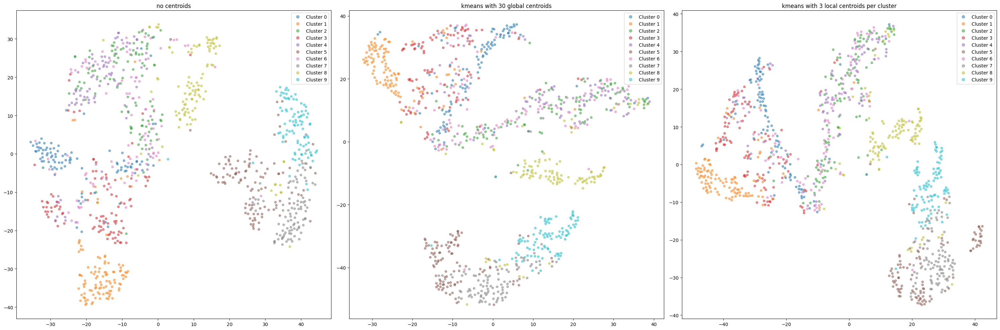

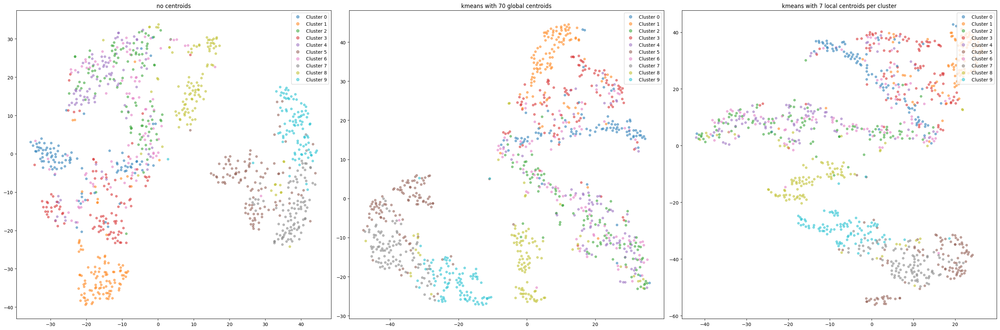

In [60]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    tsne_clean(X_test, y_test, "kmeans", axs[0])
    tsne_algorithms(kmeans_global_distances[n], y_test, "kmeans", "global", n, axs[1])
    tsne_algorithms(kmeans_local_distances[int(n/10)], y_test, "kmeans", "local", n/10, axs[2])
    
    plt.tight_layout()
    plt.show()

Agglomerative clustering

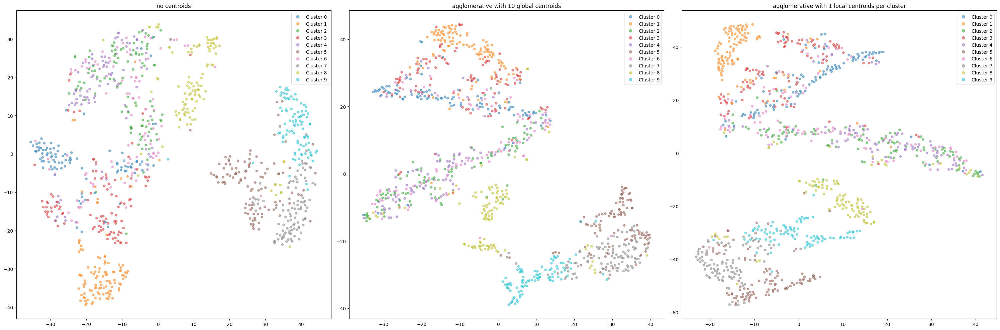

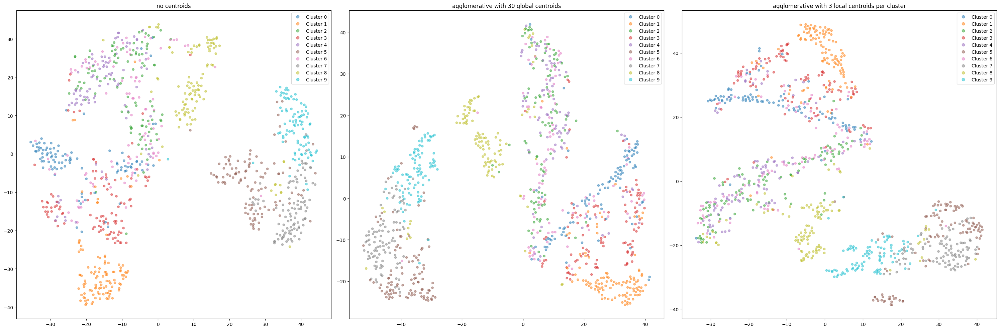

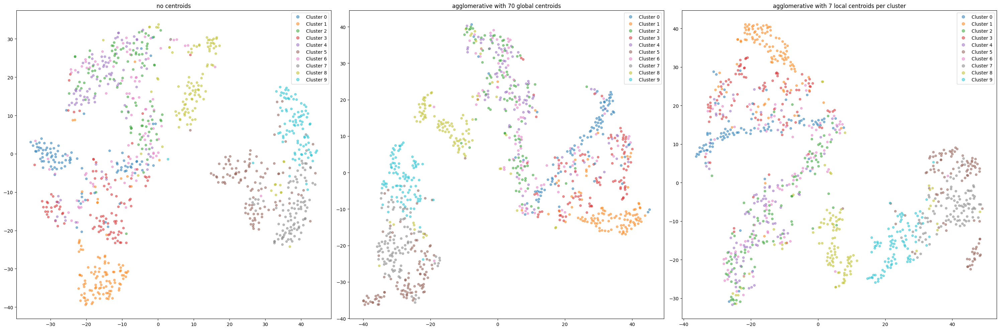

In [61]:
for n in n_centroids:
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))
    tsne_clean(X_test, y_test, "agglomerative", axs[0])
    tsne_algorithms(agglomerative_global_distances[n], y_test, "agglomerative", "global", n, axs[1])
    tsne_algorithms(agglomerative_local_distances[int(n/10)], y_test, "agglomerative", "local", n/10, axs[2])
    
    plt.tight_layout()
    plt.show()

DBSCAN

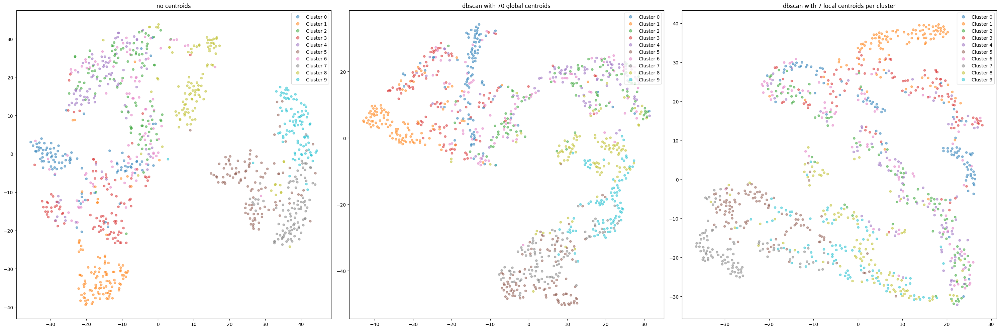

In [62]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
tsne_clean(X_test, y_test,"dbscan", axs[0])
tsne_algorithms(dbscan_global_distances, y_test, "dbscan", "global", n, axs[1])
tsne_algorithms(dbscan_local_distances, y_test, "dbscan", "local", n/10, axs[2])    

plt.tight_layout()
plt.show()